# Machine Learning - Lab 06

## Requirements
- Apply all knowledge and techniques that you have learned for this
- You must organize your notebook based on the Homework
- Should not drop NA and missing value

## Context
Churn rate is a marketing metric that describes the number of customers who leave a business over a specific time period. Every user is assigned a prediction value that estimates their state of churn at any given time. This value is based on:

User demographic information
Browsing behavior
Historical purchase data among other information
It factors in our unique and proprietary predictions of how long a user will remain a customer. This score is updated every day for all users who have a minimum of one conversion. The values assigned are between 1 and 5.

![Churn](https://thinkzone.vn/uploads/2021_10/customer-churn-1631785773-1633515705.png)


**Team Member:**
- Huynh Bao Khang - 20280050
- Dang Yen Linh - 20280058
- Nguyen Ngoc Son - 20280080 (Team Leader)
- Nguyen Van Son - 20280081

# 1 - Packages

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style('whitegrid')
from sklearn.impute import KNNImputer
from datetime import datetime

# Model
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

In [2]:
COLORS = ['#ccdbd6', '#a8af98', '#43ae9e', '#e7b24f', '#cb6e1b', '#e6d8cf', '#d7c5ad', '#a8afbb', '#7a8b9f']

In [3]:
TITLE = {'fontsize':28, 'fontstyle':'normal', 'fontfamily':'Georgia', 'backgroundcolor':'#8058af', 'color':'#ddcfed'}

# 2 - Prepare and Analyze Data

### 2.1 Prepare

In [4]:
PATH = "churn_rate_prediction.csv"

df = pd.read_csv(PATH)
df.head()

,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,fffe4300490044003600300030003800,Pattie Morrisey,18,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,...,300.63,53005.25,17.0,781.75,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,fffe43004900440032003100300035003700,Traci Peery,32,F,5K0N3X1,City,Premium Membership,2017-08-28,?,CID21329,...,306.34,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,1
2,fffe4300490044003100390032003600,Merideth Mcmeen,44,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,...,516.16,21027.00,22.0,500.69,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,fffe43004900440036003000330031003600,Eufemia Cardwell,37,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,...,53.27,25239.56,6.0,567.66,No,Yes,Yes,Unsolved,Poor Website,5
4,fffe43004900440031003900350030003600,Meghan Kosak,31,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,...,113.13,24483.66,16.0,663.06,No,Yes,Yes,Solved,Poor Website,5


### 2.2 Data Analysis

#### Check the dimensions of features

In [5]:
print(f'The shape of dataset: {df.shape}')
print(f'We have m = {df.shape[0]} customers')
print(f'We have n = {df.shape[1]} features ')

The shape of dataset: (36992, 25)
We have m = 36992 customers
We have n = 25 features 


#### Identifying unique values for each feature

In [6]:
dict = {}
for i in list(df.columns):
    dict[i] = df[i].value_counts().shape[0]

pd.DataFrame(dict,index=["unique count"]).T

,unique count
customer_id,36992
Name,36992
age,55
gender,3
security_no,36992
region_category,3
membership_category,6
joining_date,1096
joined_through_referral,3
referral_id,11359


#### Statistics of null and missing values

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36992 entries, 0 to 36991
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   customer_id                   36992 non-null  object 
 1   Name                          36992 non-null  object 
 2   age                           36992 non-null  int64  
 3   gender                        36992 non-null  object 
 4   security_no                   36992 non-null  object 
 5   region_category               31564 non-null  object 
 6   membership_category           36992 non-null  object 
 7   joining_date                  36992 non-null  object 
 8   joined_through_referral       36992 non-null  object 
 9   referral_id                   36992 non-null  object 
 10  preferred_offer_types         36704 non-null  object 
 11  medium_of_operation           36992 non-null  object 
 12  internet_option               36992 non-null  object 
 13  l

In [8]:
def plot_missing_values(df):
    missing_counts = df.isnull().sum()
    missing_counts = missing_counts[missing_counts > 0]
    sns.barplot(x=missing_counts, y=missing_counts.index, palette=COLORS)
    plt.xlabel("Number of Missing Values")
    plt.ylabel("Features")
    plt.show()

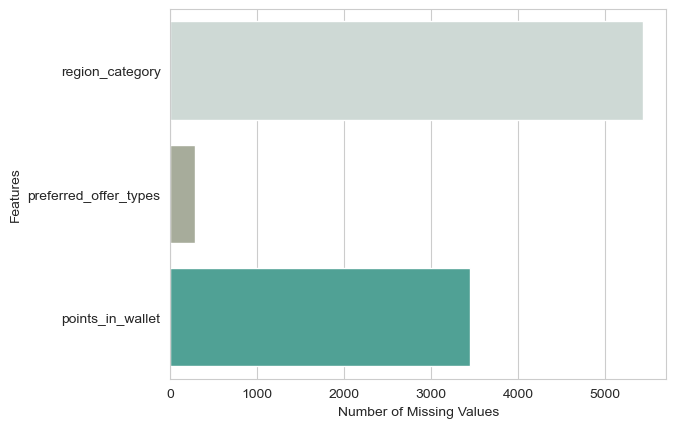

In [9]:
plot_missing_values(df)

As we can see, the features having missing values are `region_category`, `preferred_offer_types`, and `points_in_wallet` respectively.

#### Explore the types of all features

##### Categorical features

In [10]:
def plot_unique_counts(df):
    unique_counts = df.describe(include='object').T['unique']
    unique_counts = unique_counts[unique_counts > 0]
    sns.barplot(x=unique_counts, y=unique_counts.index, palette='Set2')
    plt.xlabel("Number of Unique Values")
    plt.ylabel("Features")
    plt.show()

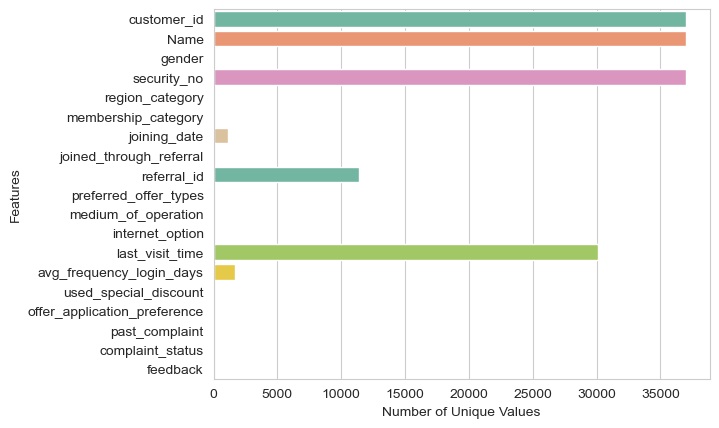

In [11]:
plot_unique_counts(df)

The reason why the categorical features are not visible in the barplot is because they have low occurrences. Meanwhile, other features that have a large number of unique values in the barplot are likely to be unrelated or insignificant. Therefore, we will disregard these features:
- `customer_id`
- `Name`
- `security_no`
- `referral_id`
- `last_visit_time`

Furthermore, our observations indicate that the following features:
- `joining_date`
- `avg_frequency_login_days`

should ideally have numerical values instead of categorical values. We are going to process them later.

##### Numerical features

In [12]:
df.describe(include='number')

,age,days_since_last_login,avg_time_spent,avg_transaction_value,points_in_wallet,churn_risk_score
count,36992.000000,36992.000000,36992.000000,36992.000000,33549.000000,36992.000000
mean,37.118161,-41.915576,243.472334,29271.194003,686.882199,3.463397
std,15.867412,228.819900,398.289149,19444.806226,194.063624,1.409661
min,10.000000,-999.000000,-2814.109110,800.460000,-760.661236,-1.000000
25%,23.000000,8.000000,60.102500,14177.540000,616.150000,3.000000
50%,37.000000,12.000000,161.765000,27554.485000,697.620000,4.000000
75%,51.000000,16.000000,356.515000,40855.110000,763.950000,5.000000
max,64.000000,26.000000,3235.578521,99914.050000,2069.069761,5.000000


In [13]:
def plot_numerical_features(df, features):
    fig, axes = plt.subplots(1,len(features), figsize=(15,4))
    for i, ax in enumerate(axes.flat):
        sns.histplot(x=features[i], data=df, ax=ax, kde=True)
    plt.tight_layout()
    plt.show()

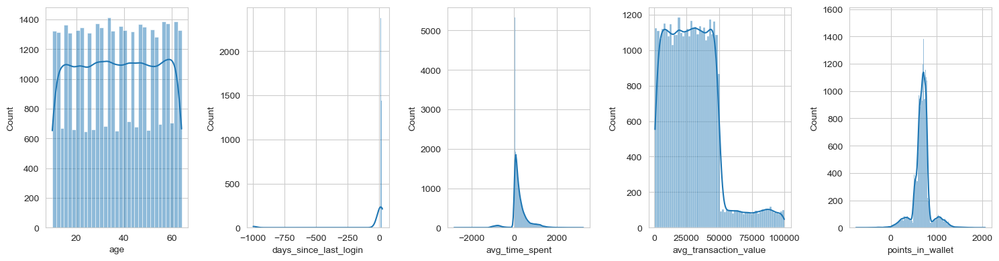

In [14]:
numerical_features = df.iloc[:,:-1].select_dtypes(include='number').columns
plot_numerical_features(df, numerical_features)

#### Visualize the distribution of target feature

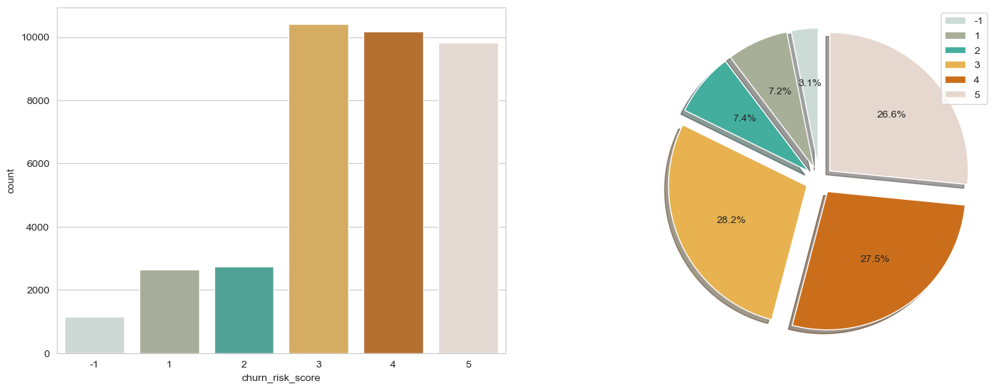

In [15]:
plt.figure(figsize=(17, 6))
plt.subplot(1, 2, 1)
sns.countplot(x='churn_risk_score', data=df, palette=COLORS)

plt.subplot(1, 2, 2)
plt.pie(x=df['churn_risk_score'].value_counts().sort_index(),
        autopct='%.1f%%', explode=(0.1,0.1,0.1,0.1,0.1,0.1),
        startangle=90, shadow=True, colors=COLORS)
plt.legend(labels=['-1', '1', '2', '3', '4', '5'])
plt.show()

- After careful analysis of the provided data, it is apparent that certain records in the `churn_risk_score` column have been assigned a value of $-1$, which is not in line with the expected range of $1$ to $5$ for the score. It seems that these $-1$ values have been erroneously labeled.

- The dataset can be considered imbalanced because the distribution of churn risk scores is not roughly equal across all $5$ labels. In this case, the majority of the records (over $80\%$) have either a churn risk score of $3$, $4$ and $5$, while the remaining scores account for a much smaller proportion of the data. This could potentially impact the performance of a machine learning model trained on this data. It may be necessary to consider strategies such as oversampling or undersampling to balance the data, etc.

#### Other visualization

In [16]:
def plot_categorical_features(df, features):
    for feature in features:
        fig, axes = plt.subplots(1, 2, figsize=(12, 3))
        counts = df[feature].value_counts().sort_index()

        sns.countplot(y=feature, data=df, palette=COLORS, order = counts.index, ax=axes[0])
        axes[0].set_ylabel("")

        explode = (0.1,) * len(counts)
        axes[1].pie(x=counts, autopct='%.2f%%', explode=explode,
                    startangle=90, shadow=True, colors=COLORS, labels=counts.index)

        fig.suptitle(feature.upper(), fontsize=14, fontweight='bold')
        plt.show()

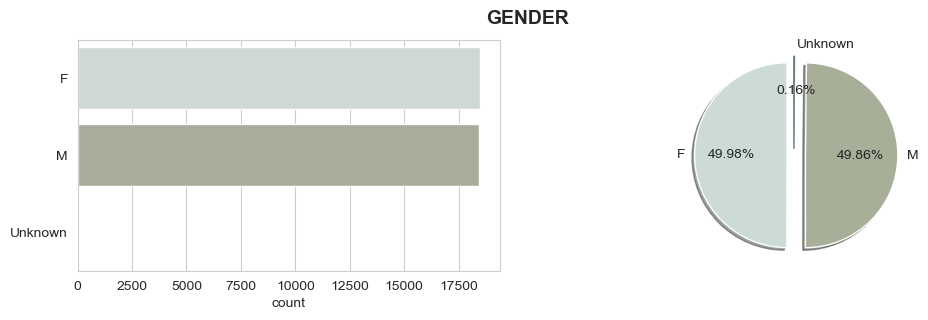

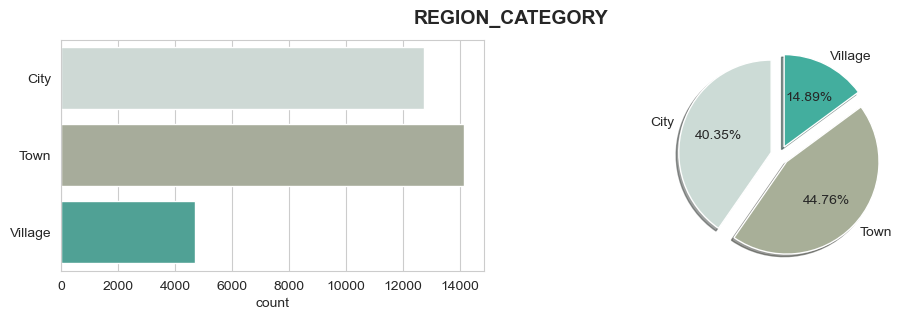

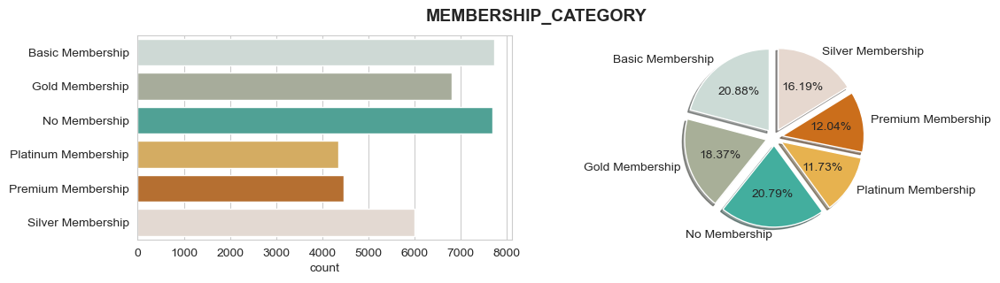

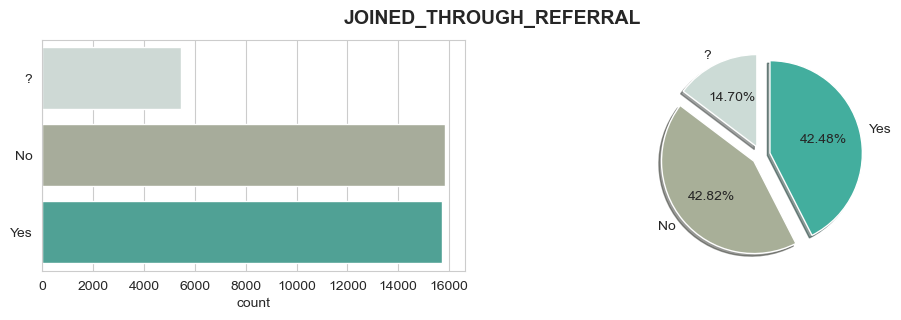

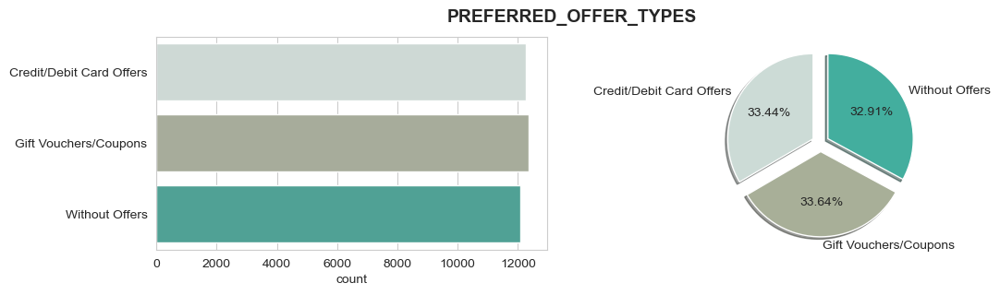

...

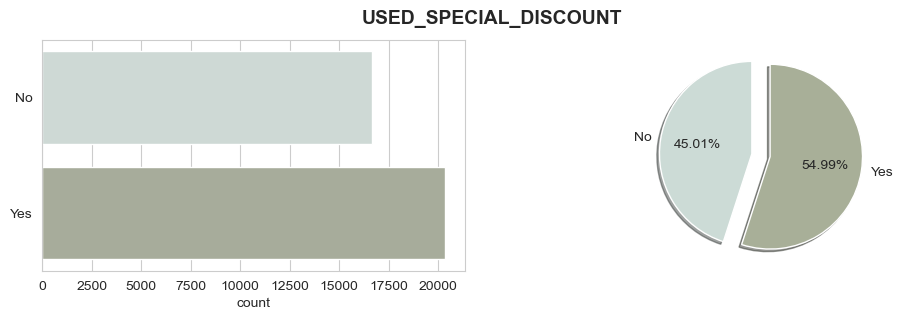

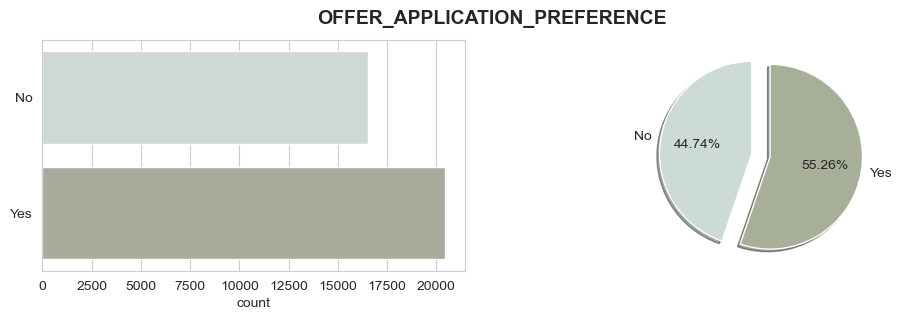

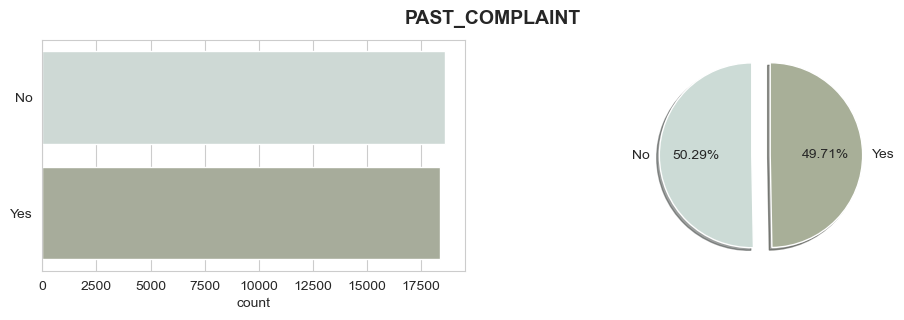

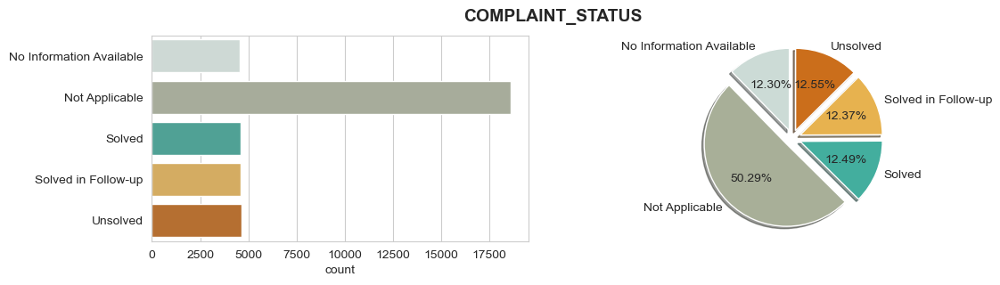

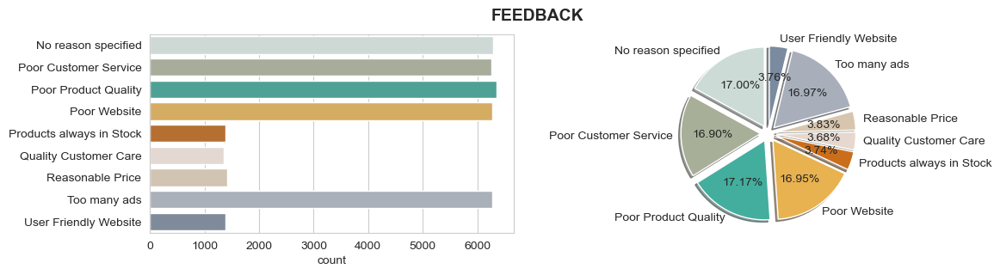

In [17]:
categorical_features = [feature for feature in df.select_dtypes(include='object').columns if feature not in ['customer_id', 'Name', 'security_no', 'joining_date', 'referral_id', 'last_visit_time', 'avg_frequency_login_days']]
plot_categorical_features(df, categorical_features)

As we can see, features containing `?` values is `joined_through_referral`, and `medium_of_operation`

Furthermore, it has come to our attention that the `feedback` feature currently consists of $9$ distinct values. To simplify the analysis, we propose reducing these values to $3$ categories as follows:
- **Positive**: `Products always in Stock`, `Quality Customer Care`, `User Friendly Website`, `Reasonable Price`
- **Negative**: `Poor Website`, `Poor Product Quality`, `Poor Customer Service`, `Too many ads`
- **Unknown**:  `No reason specified`

To simplify the analysis, we propose reducing the `membership_category` feature into $3$ categories based on their values as follows:
- **Low Membership**: This category includes membership representing `No Membership` and `Basic Membership` respectively.
- **Medium Membership**: This category comprises membership representing `Silver Membership` and `Gold Membership` respectively.
- **High Membership**: This category includes membership levels representing `Platinum Membership` and `Premium Membership` respectively.

To simplify the analysis, we propose reducing the `complaint_status` feature into $3$ categories based on their values as follows:

- **Completed**: This category includes values `Solved` and `Solved in Follow-up`, representing cases where the issue has been resolved successfully.
- **Incomplete**: This category includes the value `Unsolved`, indicating that the issue remains unresolved.
- **Unavailable**: This category includes values `Not Applicable` and `No Information Available`, indicating that the information regarding the status of the issue is not applicable or not provided.

##### Check outliers

In [18]:
def plot_boxplot(df, features):
    sns.set_style("whitegrid")
    fig, axs = plt.subplots(len(features), 1, figsize=(13, 13), sharey=True)
    for i, ax in enumerate(axs.flat):
        sns.boxplot(x=features[i], data=df, palette='Purples', ax=ax)
        ax.set_xlabel(features[i])

    plt.suptitle("Check Outlier with Boxplot", y = 1, **TITLE)
    plt.tight_layout()
    plt.show()

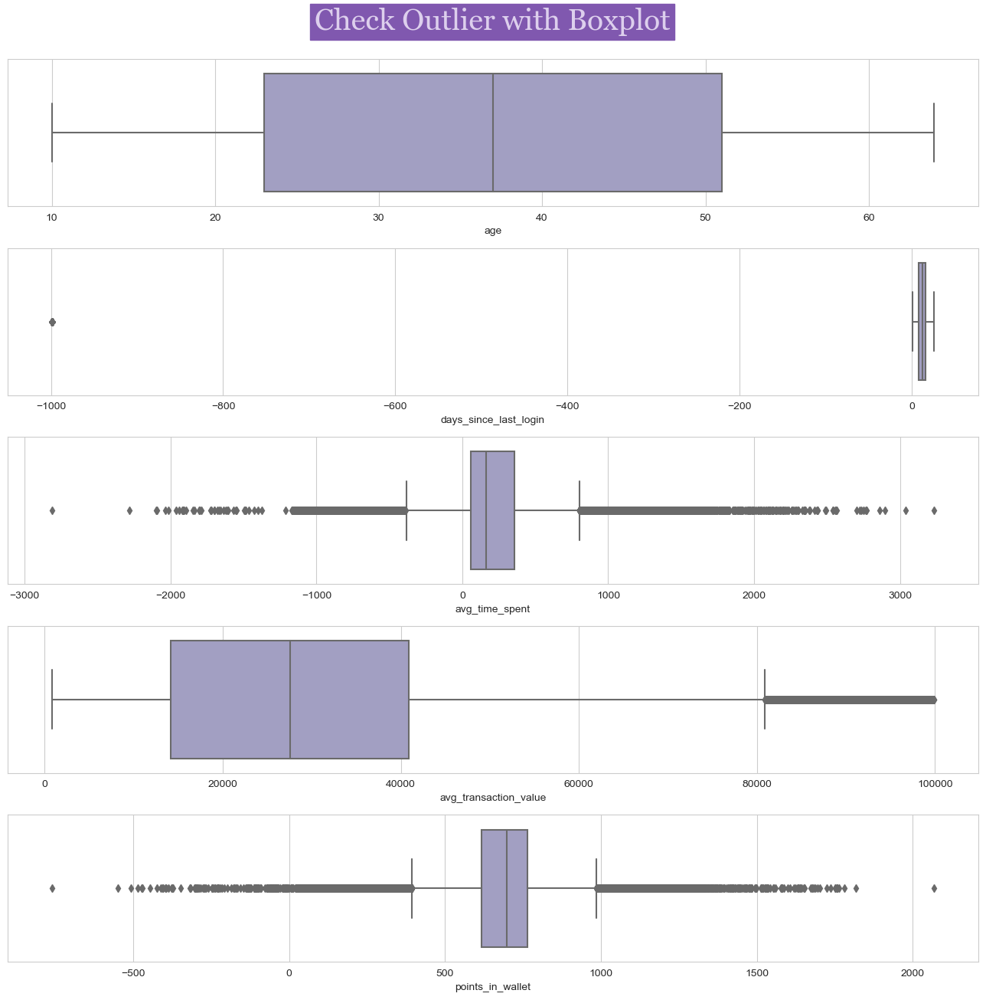

In [19]:
numerical_features = df.iloc[:,:-1].select_dtypes(include='number').columns
plot_boxplot(df, numerical_features)

Looking at the boxplots, we see that there are some outliers. We have observed that the features:
- `days_since_last_login`
- `avg_time_spent`
- `avg_transaction_value`
- `avg_frequency_login_days`
- `points_in_wallet`

should be positive values instead of negative values, so we are going to handle below.

# 3 - Preprocessing

After the data visualization step, we will proceed with the data preprocessing phase to clean and transform the dataset. This involves handling missing values, converting data types, dropping unnecessary columns, simplifying categorical features, and addressing any other data inconsistencies. These preprocessing steps aim to prepare the dataset for analysis by ensuring data quality, uniformity, and relevance.

### 3.1 Data Preprocessing

**Data Preprocessing Step**

In this step, we perform several preprocessing tasks to clean and transform the dataset. These tasks are encapsulated within the `preprocessing_data` function. The following operations are executed:

1. **Removal of Unnecessary Columns**: The columns `customer_id`, `Name`, `security_no`, `referral_id`, and `last_visit_time` are eliminated from the dataset since they are considered unnecessary.

2. **Handling Missing Values**: Any occurrence of `'?'` in the dataset is replaced with `NaN`, which indicates missing values.

3. **Conversion of Joining Date**: The `'joining_date'` column is converted from a string format to a datetime format using the `strptime` function. Subsequently, the number of days since the earliest joining date in the column is calculated.

4. **Conversion of Average Login Frequency**: The data type of the `'avg_frequency_login_days'` column is converted to numeric. Any occurrence of the value `'Error'` in this column is replaced with `NaN`.

5. **Dealing with Missing Values in Categorical Columns**: The missing values in each categorical column are addressed by filling them with the corresponding `missing` value from that column, which is accomplished using the `fillna` method.

Finally, the modified dataframe is returned by the function.

In [20]:
def preprocessing_data(df):
    # drop unnecessary columns
    df = df.drop(['customer_id', 'Name', 'security_no', 'referral_id', 'last_visit_time'], axis=1)

    # replaces all occurrences of '?' in the dataframe with NaN (missing value)
    df.replace('?', np.NaN, inplace=True)

    # converts the 'joining_date' column from string format to datetime format
    df['joining_date'] = df['joining_date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))
    # calculates the number of days since the earliest joining date in the 'joining_date' column
    df['joining_date'] = (df['joining_date'] - df['joining_date'].min()).dt.days

    # converts the 'avg_frequency_login_days' column to numeric data type
    df['avg_frequency_login_days'] = pd.to_numeric(df['avg_frequency_login_days'], errors='coerce')

    # fills missing values in each categorical column with the 'missing' of that column
    Missing_cat = df[['preferred_offer_types','region_category','joined_through_referral','medium_of_operation']]
    for i,col in enumerate(Missing_cat):
        df[col].fillna('missing', inplace=True)
   
    return df

In [21]:
df_prep = preprocessing_data(df.copy())
df_prep

,age,gender,region_category,membership_category,joining_date,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,18,F,Village,Platinum Membership,959,No,Gift Vouchers/Coupons,missing,Wi-Fi,17,300.630000,53005.25,17.0,781.750000,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,32,F,City,Premium Membership,970,missing,Gift Vouchers/Coupons,Desktop,Mobile_Data,16,306.340000,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,1
2,44,F,Town,No Membership,680,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,14,516.160000,21027.00,22.0,500.690000,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,37,M,City,No Membership,667,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,11,53.270000,25239.56,6.0,567.660000,No,Yes,Yes,Unsolved,Poor Website,5
4,31,F,City,No Membership,985,No,Credit/Debit Card Offers,Smartphone,Mobile_Data,20,113.130000,24483.66,16.0,663.060000,No,Yes,Yes,Solved,Poor Website,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46,F,missing,Basic Membership,994,No,Credit/Debit Card Offers,Desktop,Wi-Fi,2,-650.682759,27277.68,6.0,639.510000,No,Yes,Yes,No Information Available,No reason specified,4
36988,29,F,Town,Basic Membership,543,No,Without Offers,Smartphone,Wi-Fi,13,-638.123421,11069.71,28.0,527.990000,Yes,No,No,Not Applicable,Poor Customer Service,5
36989,23,F,missing,Basic Membership,619,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,12,154.940000,38127.56,NaN,680.470000,No,Yes,Yes,Unsolved,Poor Website,4
36990,53,M,Village,Platinum Membership,896,No,Gift Vouchers/Coupons,Smartphone,Mobile_Data,15,482.610000,2378.86,20.0,197.264414,Yes,Yes,No,Not Applicable,No reason specified,3


#### Simplify categorical features

1. **Simplifying Membership Categories**: The `'membership_category'` feature is simplified into three categories:
    - **Low Membership**: This category includes membership representing `No Membership` and `Basic Membership` respectively.
    - **Medium Membership**: This category comprises membership representing `Silver Membership` and `Gold Membership` respectively.
    - **High Membership**: This category includes membership levels representing `Platinum Membership` and `Premium Membership` respectively.

2. **Simplifying Complaint Status**: The `'complaint_status'` feature is simplified into three categories:
    - **Completed**: This category includes values `Solved` and `Solved in Follow-up`, representing cases where the issue has been resolved successfully.
    - **Incomplete**: This category includes the value `Unsolved`, indicating that the issue remains unresolved.
    - **Unavailable**: This category includes values `Not Applicable` and `No Information Available`, indicating that the information regarding the status of the issue is not applicable or not provided.

3. **Simplifying Feedback**: The `'feedback'` feature is simplified into three categories:
    - **Positive**: `Products always in Stock`, `Quality Customer Care`, `User Friendly Website`, `Reasonable Price`
    - **Negative**: `Poor Website`, `Poor Product Quality`, `Poor Customer Service`, `Too many ads`
    - **Unknown**:  `No reason specified`

In [22]:
def simplify_categories(df):
    # Simplify the 'membership_category' feature into 3 categories
    df['membership_category'] = df['membership_category'].replace(['No Membership', 'Basic Membership'], 'Low Membership')
    df['membership_category'] = df['membership_category'].replace(['Silver Membership', 'Gold Membership'], 'Medium Membership')
    df['membership_category'] = df['membership_category'].replace(['Platinum Membership', 'Premium Membership'], 'High Membership')

    # Simplify the 'complaint_status' feature into 3 categories
    df['complaint_status'] = df['complaint_status'].replace(['Solved', 'Solved in Follow-up'], 'Completed')
    df['complaint_status'] = df['complaint_status'].replace('Unsolved', 'Incomplete')
    df['complaint_status'] = df['complaint_status'].replace(['Not Applicable', 'No Information Available'], 'Unavailable')

    # Simplify the 'feedback' feature into 3 categories
    df['feedback'] = df['feedback'].replace(['Products always in Stock', 'Quality Customer Care', 'User Friendly Website', 'Reasonable Price'], 'Positive')
    df['feedback'] = df['feedback'].replace(['Poor Website', 'Poor Product Quality', 'Poor Customer Service', 'Too many ads'], 'Negative')
    df['feedback'] = df['feedback'].replace('No reason specified', 'Unknown')

    return df

In [23]:
df_simplified = simplify_categories(df_prep)
df_simplified

,age,gender,region_category,membership_category,joining_date,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,18,F,Village,High Membership,959,No,Gift Vouchers/Coupons,missing,Wi-Fi,17,300.630000,53005.25,17.0,781.750000,Yes,Yes,No,Unavailable,Positive,2
1,32,F,City,High Membership,970,missing,Gift Vouchers/Coupons,Desktop,Mobile_Data,16,306.340000,12838.38,10.0,NaN,Yes,No,Yes,Completed,Positive,1
2,44,F,Town,Low Membership,680,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,14,516.160000,21027.00,22.0,500.690000,No,Yes,Yes,Completed,Negative,5
3,37,M,City,Low Membership,667,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,11,53.270000,25239.56,6.0,567.660000,No,Yes,Yes,Incomplete,Negative,5
4,31,F,City,Low Membership,985,No,Credit/Debit Card Offers,Smartphone,Mobile_Data,20,113.130000,24483.66,16.0,663.060000,No,Yes,Yes,Completed,Negative,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46,F,missing,Low Membership,994,No,Credit/Debit Card Offers,Desktop,Wi-Fi,2,-650.682759,27277.68,6.0,639.510000,No,Yes,Yes,Unavailable,Unknown,4
36988,29,F,Town,Low Membership,543,No,Without Offers,Smartphone,Wi-Fi,13,-638.123421,11069.71,28.0,527.990000,Yes,No,No,Unavailable,Negative,5
36989,23,F,missing,Low Membership,619,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,12,154.940000,38127.56,NaN,680.470000,No,Yes,Yes,Incomplete,Negative,4
36990,53,M,Village,High Membership,896,No,Gift Vouchers/Coupons,Smartphone,Mobile_Data,15,482.610000,2378.86,20.0,197.264414,Yes,Yes,No,Unavailable,Unknown,3


## 3.2 Processing Outlier

It identifies outliers in each specified feature using the IQR method. The IQR is calculated as the difference between the third quartile (Q3) and the first quartile (Q1). The lower bound and upper bound for identifying outliers are set as 1.5 times the IQR below Q1 and above Q3, respectively. Any values outside this range are replaced with `NaN`. The function returns the DataFrame with outliers handled.

In [24]:
def IQR_outlier(df, features):
    """
    Identify and handle outliers in the specified features using the IQR (Interquartile Range) method.
    :param df: pandas DataFrame
    :param features: list of feature column names to be processed
    :return: pandas DataFrame with outliers replaced with NaN
    """
    for feature in features:
        Q1 = df[feature].quantile(0.25)
        Q3 = df[feature].quantile(0.75)
        IQR = Q3 - Q1
        lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        df.loc[~((df[feature] >= lower) & (df[feature] <= upper)), feature] = np.nan
    return df

Applies the IQR (Interquartile Range) method to handle outliers for specific features in a DataFrame. It then replaces any negative values in the numerical columns with NaN.

In [25]:
df_processed = IQR_outlier(df_simplified.copy(), features=['points_in_wallet', 'avg_frequency_login_days', 'days_since_last_login', 'avg_time_spent', 'avg_transaction_value'])

# replace values less than 0 in column with NaN
numerical_features = df_processed.iloc[:,:-1].select_dtypes(include='number').columns
for feature in numerical_features:
    df_processed[feature] = df_processed[feature].apply(lambda x: np.NaN if x < 0 else x)

Uses the `KNNImputer` from scikit-learn to impute missing values in specific features of the DataFrame. It iterates through the selected features, applies the KNN imputation to each feature individually, and replaces the missing values with the imputed values.

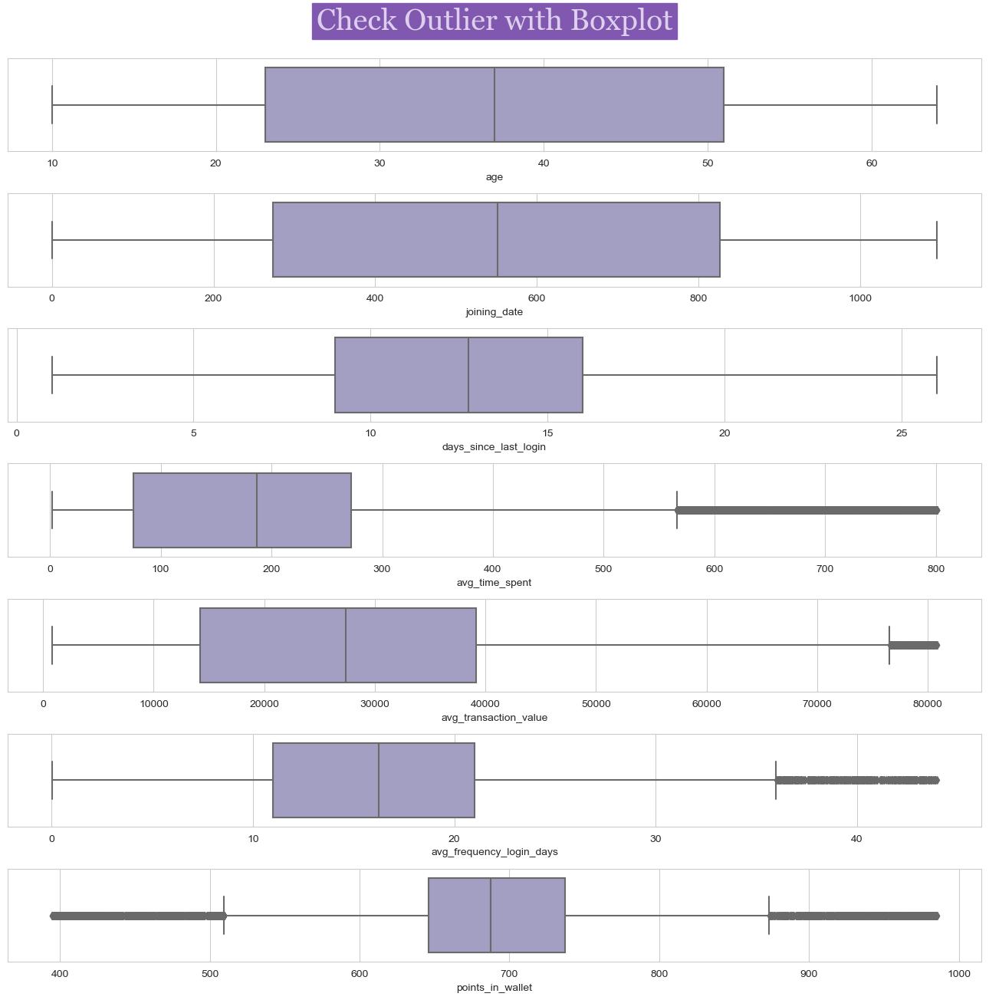

In [26]:
features=['points_in_wallet', 'avg_frequency_login_days', 'days_since_last_login', 'avg_time_spent', 'avg_transaction_value']
for feature in features:
    imputer = KNNImputer()
    column_data = df_processed[[feature]].values
    imputed_column_data = imputer.fit_transform(column_data)
    df_processed[feature] = imputed_column_data

plot_boxplot(df_processed, numerical_features)

In [27]:
df_processed

,age,gender,region_category,membership_category,joining_date,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,18,F,Village,High Membership,959,No,Gift Vouchers/Coupons,missing,Wi-Fi,17.0,300.63000,53005.25,17.0000,781.750000,Yes,Yes,No,Unavailable,Positive,2
1,32,F,City,High Membership,970,missing,Gift Vouchers/Coupons,Desktop,Mobile_Data,16.0,306.34000,12838.38,10.0000,687.396149,Yes,No,Yes,Completed,Positive,1
2,44,F,Town,Low Membership,680,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,14.0,516.16000,21027.00,22.0000,500.690000,No,Yes,Yes,Completed,Negative,5
3,37,M,City,Low Membership,667,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,11.0,53.27000,25239.56,6.0000,567.660000,No,Yes,Yes,Incomplete,Negative,5
4,31,F,City,Low Membership,985,No,Credit/Debit Card Offers,Smartphone,Mobile_Data,20.0,113.13000,24483.66,16.0000,663.060000,No,Yes,Yes,Completed,Negative,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46,F,missing,Low Membership,994,No,Credit/Debit Card Offers,Desktop,Wi-Fi,2.0,209.04823,27277.68,6.0000,639.510000,No,Yes,Yes,Unavailable,Unknown,4
36988,29,F,Town,Low Membership,543,No,Without Offers,Smartphone,Wi-Fi,13.0,209.04823,11069.71,28.0000,527.990000,Yes,No,No,Unavailable,Negative,5
36989,23,F,missing,Low Membership,619,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,12.0,154.94000,38127.56,16.2558,680.470000,No,Yes,Yes,Incomplete,Negative,4
36990,53,M,Village,High Membership,896,No,Gift Vouchers/Coupons,Smartphone,Mobile_Data,15.0,482.61000,2378.86,20.0000,687.396149,Yes,Yes,No,Unavailable,Unknown,3


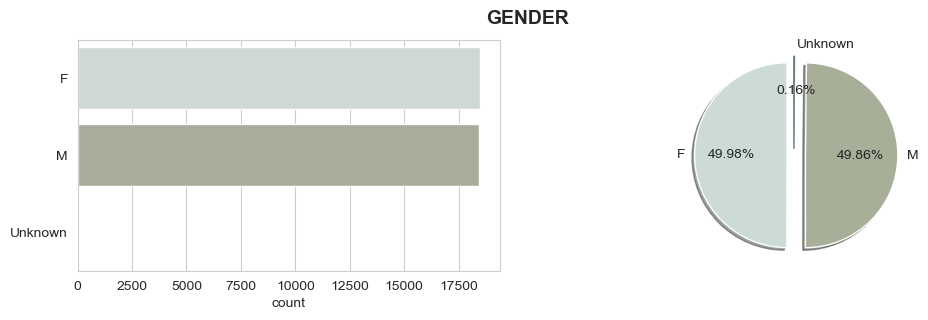

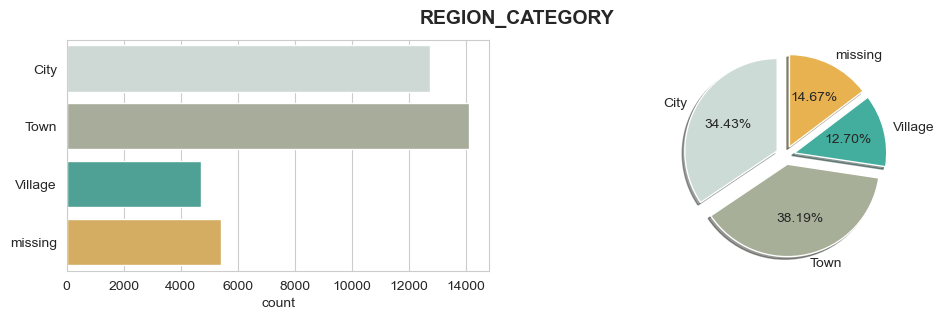

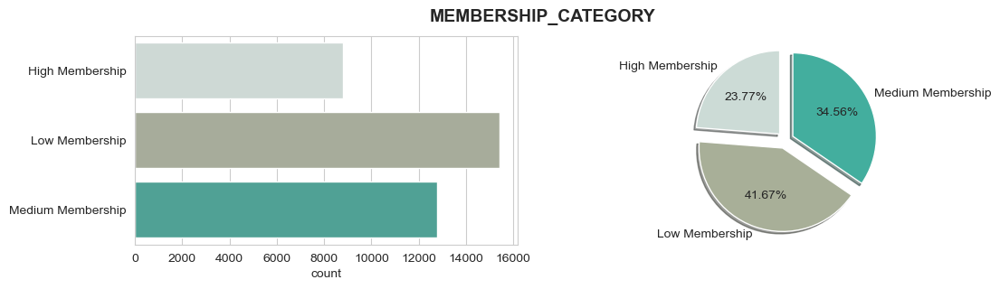

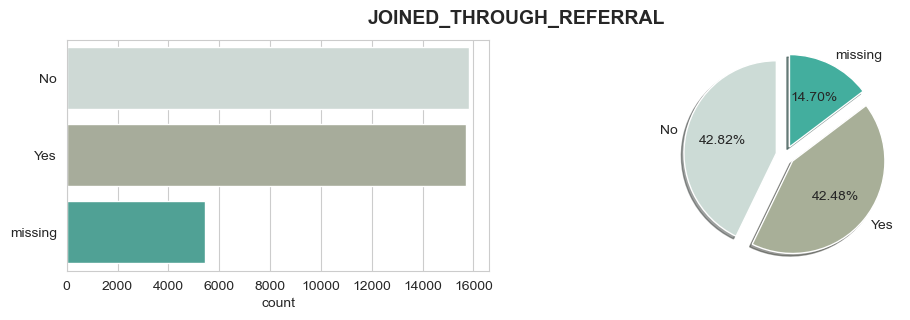

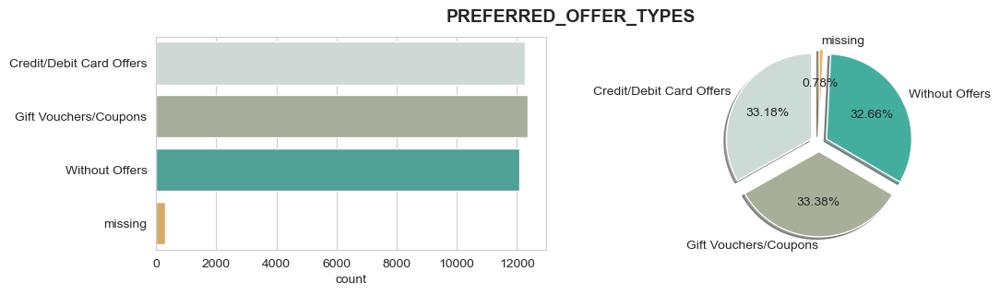

...

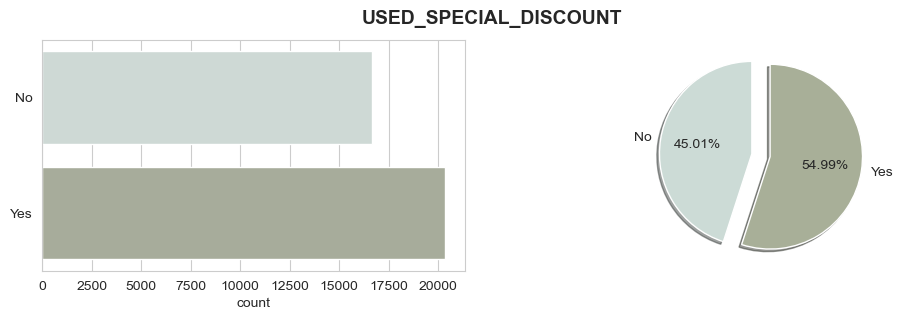

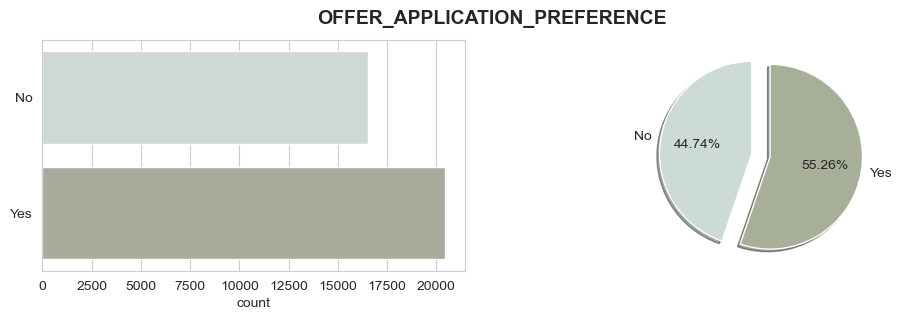

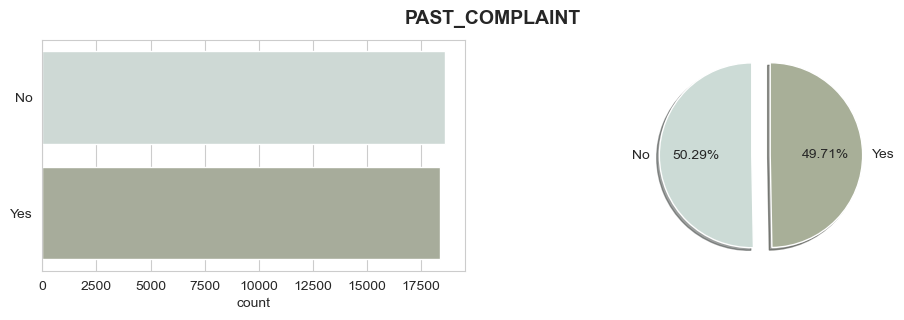

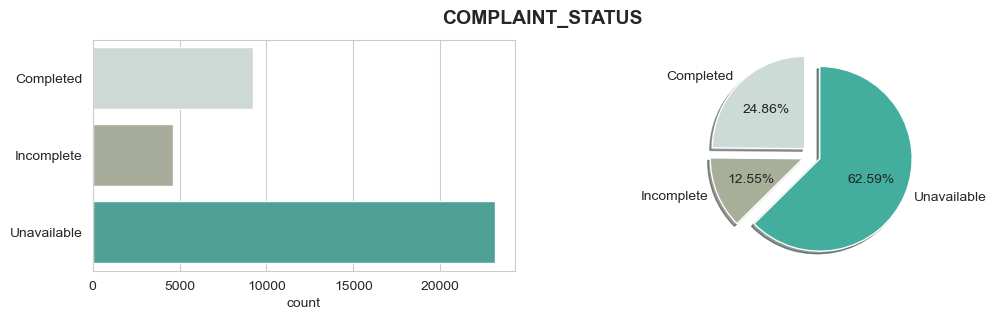

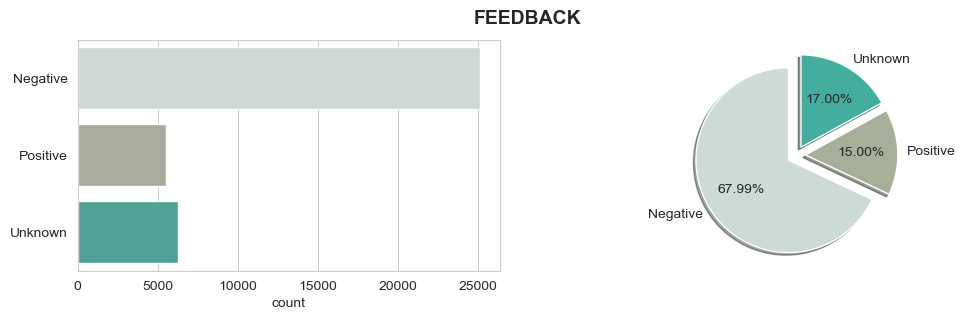

In [28]:
plot_categorical_features(df_processed, categorical_features)

# 4 - Feature Engineering

In the dataset, there are two categorical features named `membership_category` and `feedback` that exhibit an ordinal nature.

- The `membership_category` feature has values that can be ordered as follows: `No Membership` < `Basic Membership` < `Gold Membership` < `Platinum Membership` < `Premium Membership`.

- The `feedback` feature has values that can be ordered as follows: `Negative` < `Unknown` < `Positive`.

In [29]:
def apply_feature_engineering(df):
    """
    Apply all feature engineering to transform data into number
    """
   
    for feature in df.select_dtypes(include='object').columns:
        if feature == 'membership_category':
            rank = {
                'Low Membership': 0,
                'Medium Membership': 1,
                'High Membership': 2
            }
            df['membership_category'] = df['membership_category'].replace(rank)

        if feature == 'feedback':
            rank = {
                'Negative': 0,
                'Unknown': 1,
                'Positive': 2
            }
            df['feedback'] = df['feedback'].replace(rank)

        else:
            df[feature] = df[feature].astype('category').cat.codes
    return df

In [30]:
df_cleaned = apply_feature_engineering(df_processed.copy())

In [31]:
df_cleaned

,age,gender,region_category,membership_category,joining_date,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,18,0,2,2,959,0,1,3,2,17.0,300.63000,53005.25,17.0000,781.750000,1,1,0,2,2,2
1,32,0,0,2,970,2,1,1,1,16.0,306.34000,12838.38,10.0000,687.396149,1,0,1,0,2,1
2,44,0,1,0,680,1,1,1,2,14.0,516.16000,21027.00,22.0000,500.690000,0,1,1,0,0,5
3,37,1,0,0,667,1,1,1,1,11.0,53.27000,25239.56,6.0000,567.660000,0,1,1,1,0,5
4,31,0,0,0,985,0,0,2,1,20.0,113.13000,24483.66,16.0000,663.060000,0,1,1,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46,0,3,0,994,0,0,1,2,2.0,209.04823,27277.68,6.0000,639.510000,0,1,1,2,1,4
36988,29,0,1,0,543,0,2,2,2,13.0,209.04823,11069.71,28.0000,527.990000,1,0,0,2,0,5
36989,23,0,3,0,619,1,1,1,2,12.0,154.94000,38127.56,16.2558,680.470000,0,1,1,1,0,4
36990,53,1,2,2,896,0,1,2,1,15.0,482.61000,2378.86,20.0000,687.396149,1,1,0,2,1,3


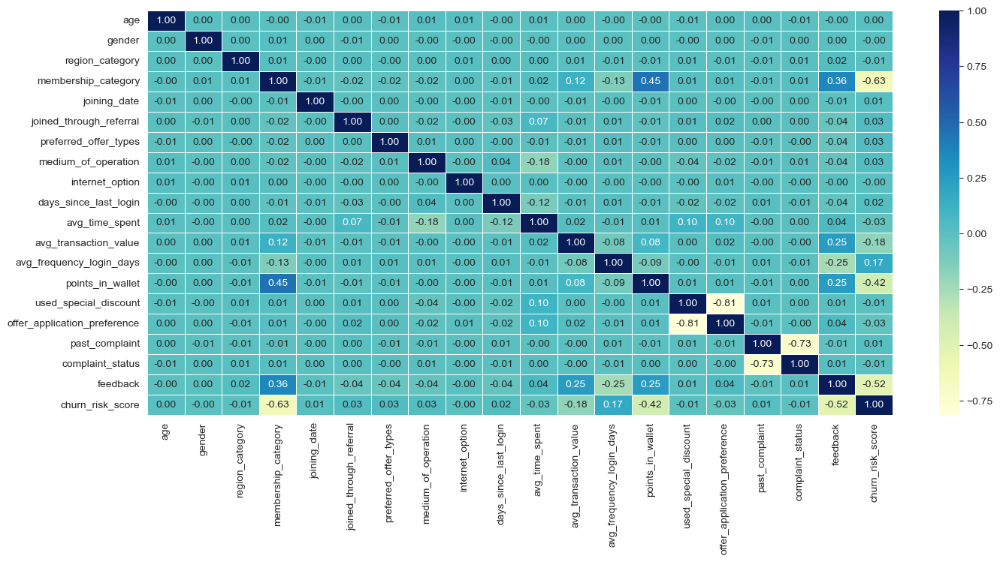

In [32]:
def plot_heatmap(df):
    fig, ax = plt.subplots(figsize=(16,7))
    ax = sns.heatmap(df.corr(), annot=True, linewidths=0.5, fmt=".2f", cmap="YlGnBu")
    plt.show()

plot_heatmap(df_cleaned)

Based on the analysis conducted earlier, it appears that the values of `-1` in the `churn_risk_score` column have been incorrectly labeled. To address this issue, we will approach the problem as **semi-supervised learning**. The dataset will be divided into two parts:

1. Unlabeled Data: This portion will consist of all the data points that have a value of `-1` in the `churn_risk_score` column. These data points are considered unlabeled since their actual churn risk score is unknown.

2. Labeled Data: The remaining data points, excluding those with a value of `-1` in the `churn_risk_score` column, will form the labeled data. These data points have valid churn risk scores assigned to them.

By adopting this semi-supervised learning approach, we aim to address the mislabeled values and improve the accuracy of the churn risk score predictions.

The semi-supervised learning process consists of the following steps:

1. The model is trained using the labeled data available.
2. The trained model is then used to make predictions for the unlabeled data, creating a set of pseudo-labeled data.
3. The model is retrained using both the pseudo-labeled data and the labeled data combined.

### 4.1 Create a set of pseudo-labeled data

We are going to apply the `XGBoost` to train the labeled data.

In [33]:
def build_model_xgb(X, y):
    n = int(len(X)*0.8)
    X_train_fit, X_train_eval, y_train_fit, y_train_eval = X[:n], X[n:], y[:n], y[n:]

    scaler = RobustScaler()
    clf = XGBClassifier(random_state = 42,
                        early_stopping_rounds=20,
                        n_estimators=100,
                        learning_rate=0.01,
                        objective='multi:softmax',
                        max_depth=8)
    fit_params = {'clf__eval_set': [(X_train_eval, y_train_eval)]}
    model = Pipeline([('scaler', scaler), ('clf', clf)])
    model.fit(X_train_fit, y_train_fit, **fit_params)
    return model

Split dataset into unlabeled data and labeled data.

In [34]:
data_labeled = df_cleaned[df_cleaned['churn_risk_score'] != -1].values
data_unlabeled = df_cleaned[df_cleaned['churn_risk_score'] == -1].values

Train model using the labeled data.

In [35]:
X_labeled, y_labeled = data_labeled[:,:-1], data_labeled[:,-1]-1
xgb = build_model_xgb(X_labeled, y_labeled)

[0]	validation_0-mlogloss:1.60207
[1]	validation_0-mlogloss:1.59617
[2]	validation_0-mlogloss:1.58967
[3]	validation_0-mlogloss:1.58329
[4]	validation_0-mlogloss:1.57666
[5]	validation_0-mlogloss:1.57120
[6]	validation_0-mlogloss:1.56612
[7]	validation_0-mlogloss:1.56063
[8]	validation_0-mlogloss:1.55605
[9]	validation_0-mlogloss:1.55012
[10]	validation_0-mlogloss:1.54534
[11]	validation_0-mlogloss:1.54005
[12]	validation_0-mlogloss:1.53540
[13]	validation_0-mlogloss:1.53036
[14]	validation_0-mlogloss:1.52586
[15]	validation_0-mlogloss:1.52061
[16]	validation_0-mlogloss:1.51683
[17]	validation_0-mlogloss:1.51264
[18]	validation_0-mlogloss:1.50816
[19]	validation_0-mlogloss:1.50371
[20]	validation_0-mlogloss:1.49951
[21]	validation_0-mlogloss:1.49570
[22]	validation_0-mlogloss:1.49163
[23]	validation_0-mlogloss:1.48721
[24]	validation_0-mlogloss:1.48365
[25]	validation_0-mlogloss:1.47988
[26]	validation_0-mlogloss:1.47697
[27]	validation_0-mlogloss:1.47249
[28]	validation_0-mlogloss:1.4

Use the trained model to predict unlabeled data.

In [36]:
X_unlabeled = data_unlabeled[:,:-1]
pred_unlabeled = xgb.predict(X_unlabeled)+1

Concatenate `X_unlabeled` and `pred_unlabeled` to create pseudo-labeled data.

In [37]:
pseudo_labeled = np.concatenate((X_unlabeled, pred_unlabeled.reshape(-1,1)), axis=1)

### 4.2 Combine labeled data and pseudo-labeled data

In [38]:
data_final = np.concatenate((pseudo_labeled, data_labeled), axis=0)

In [39]:
df_final = pd.DataFrame(data_final, columns=df_cleaned.columns)
df_final

,age,gender,region_category,membership_category,joining_date,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,48.0,1.0,1.0,0.0,1044.0,1.0,2.0,2.0,0.0,12.0,72.52000,15860.41,3.207386,529.030000,0.0,1.0,0.0,2.0,1.0,5.0
1,23.0,1.0,2.0,1.0,294.0,1.0,2.0,3.0,2.0,10.0,65.25000,5136.08,16.255800,755.220000,0.0,1.0,0.0,2.0,0.0,3.0
2,40.0,1.0,1.0,2.0,761.0,2.0,1.0,1.0,0.0,3.0,33.82000,39735.58,25.000000,784.320000,1.0,0.0,1.0,2.0,0.0,3.0
3,18.0,0.0,0.0,0.0,533.0,1.0,0.0,2.0,1.0,20.0,156.06000,4783.23,28.756399,597.870000,1.0,0.0,1.0,2.0,0.0,5.0
4,55.0,1.0,0.0,2.0,103.0,1.0,0.0,0.0,1.0,1.0,209.04823,2367.56,25.000000,441.836550,1.0,0.0,0.0,2.0,1.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46.0,0.0,3.0,0.0,994.0,0.0,0.0,1.0,2.0,2.0,209.04823,27277.68,6.000000,639.510000,0.0,1.0,1.0,2.0,1.0,4.0
36988,29.0,0.0,1.0,0.0,543.0,0.0,2.0,2.0,2.0,13.0,209.04823,11069.71,28.000000,527.990000,1.0,0.0,0.0,2.0,0.0,5.0
36989,23.0,0.0,3.0,0.0,619.0,1.0,1.0,1.0,2.0,12.0,154.94000,38127.56,16.255800,680.470000,0.0,1.0,1.0,1.0,0.0,4.0
36990,53.0,1.0,2.0,2.0,896.0,0.0,1.0,2.0,1.0,15.0,482.61000,2378.86,20.000000,687.396149,1.0,1.0,0.0,2.0,1.0,3.0


### 4.3 Prepare dataset

In [40]:
def prepare_X_y(df):
    # Split data into X and y (using sklearn train_test_split). Return two dataframes
    feature_names = df.columns.tolist()
    feature_names.remove("churn_risk_score")

    X = df[feature_names].values
    y = df.churn_risk_score.values
    return X, y

X, y = prepare_X_y(df_final)

# 5 - Apply machine learning model

### 5.1 Train-test split

Split original dataset $X$ into 2 parts with $80\%$ as the training set, $20 \%$ as testing set and the label corresponding to those 2 sets.

In [41]:
RANDOM_STATE = 2023
TRAIN_SIZE = 0.8

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=TRAIN_SIZE, random_state=RANDOM_STATE)

In [42]:
print('Training:' + str(X_train.shape))
print('Test:' + str(X_test.shape))

Training:(29593, 19)
Test:(7399, 19)


### 5.2 Build models

Firstly, we are going to initialize a dictionary to store all models.

In [1]:
models={}

### 5.2.1 Without oversampling

In [5]:
scaler = RobustScaler()
clf = SVC()
pipe = Pipeline([('scaler', scaler), ('clf', clf)])

params_grid = {
    'clf__C': [0.1, 1, 10],
    'clf__gamma': ['scale', 'auto', 10, 1, 0.1, 0.01],
    'clf__kernel': ['rbf'],
    'clf__class_weight': ['balanced', None]
}

scorer = make_scorer(recall_score, average = 'weighted')
grid_search = GridSearchCV(pipe, params_grid, cv=5, n_jobs=5, scoring=scorer)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

Best parameters: {'clf__C': 0.1, 'clf__class_weight': None, 'clf__gamma': 0.1, 'clf__kernel': 'rbf'}


Use the best hyperparameters have been found to train the SVM model.

In [ ]:
def build_model_svm(X, y):
    scaler = RobustScaler()
    clf = SVC(C= 0.1, gamma=0.1, kernel='rbf')
    model = Pipeline([('scaler', scaler), ('clf', clf)])
    model.fit(X, y)
    return model

In [ ]:
models['SVM'] = build_model_svm(X_train, y_train)

### 5.2.2 Oversampling

In [ ]:
smote = SMOTE()
X_train_oversampling, y_train_oversampling = smote.fit_resample(X_train, y_train)

In [4]:
scaler = RobustScaler()
clf = SVC()
pipe = Pipeline([('scaler', scaler), ('clf', clf)])

params_grid = {
    'clf__C': [0.1, 1, 10],
    'clf__gamma': ['scale', 'auto', 10, 1, 0.1, 0.01],
    'clf__kernel': ['rbf']
}

scorer = make_scorer(recall_score, average = 'macro')
grid_search = GridSearchCV(pipe, params_grid, cv=5, n_jobs=5, scoring=scorer)
grid_search.fit(X_train_oversampling, y_train_oversampling)
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

Best parameters: {'clf__C': 10, 'clf__gamma': 1, 'clf__kernel': 'rbf'}


Use the best hyperparameters have been found to train the SVM model.

In [ ]:
def build_model_svm_oversampling(X, y):
    scaler = RobustScaler()
    clf = SVC(C= 10, gamma=1, kernel='rbf')
    model = Pipeline([('scaler', scaler), ('clf', clf)])
    model.fit(X, y)
    return model

In [ ]:
models['SVM_Oversampling'] = build_model_svm_oversampling(X_train_oversampling, y_train_oversampling)

### 5.3 Measure Performance of The Models

We have developed two SVM models: one that incorporates a strategy to handle class imbalance (oversampling) and another that does not involve any specific strategy for addressing the imbalance. Let's see those models.

In [ ]:
models

{'SVM': Pipeline(steps=[('scaler', RobustScaler()), ('clf', SVC(C=0.1, gamma=0.1))]),
 'SVM_Oversampling': Pipeline(steps=[('scaler', RobustScaler()), ('clf', SVC(C=10, gamma=1))])}

In [ ]:
pred_svm_test = models['SVM'].predict(X_test).astype(int)
pred_svm_train = models['SVM'].predict(X_train).astype(int)

pred_svm_oversampling_test = models['SVM_Oversampling'].predict(X_test).astype(int)
pred_svm_oversampling_train = models['SVM_Oversampling'].predict(X_train_oversampling).astype(int)

In [ ]:
name_metrics = ['Precision', 'Recall', 'F1-score']

### 5.3.1 Macro Average

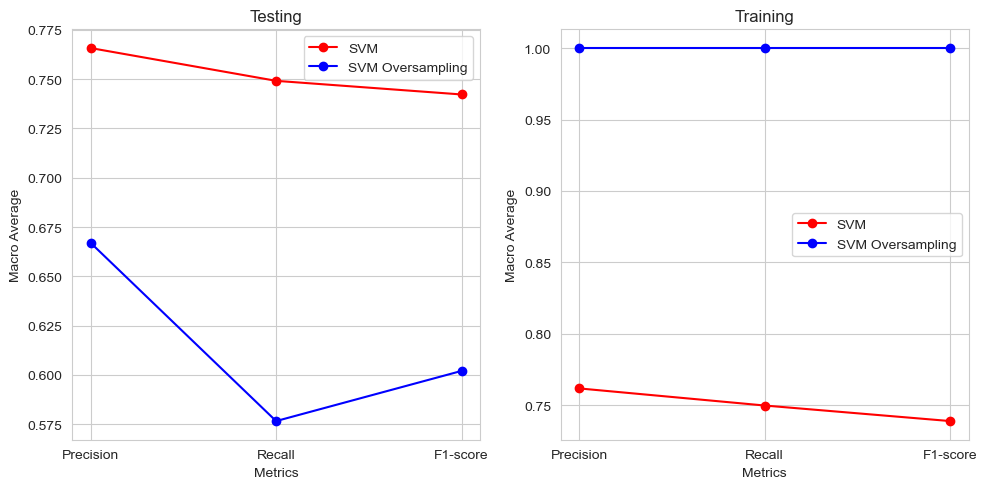

In [ ]:
macro_avg_svm_test = classification_report(y_test, pred_svm_test, output_dict=True)['macro avg'].values()
macro_avg_svm_oversampling_test = classification_report(y_test, pred_svm_oversampling_test, output_dict=True)['macro avg'].values()

macro_avg_svm_train = classification_report(y_train, pred_svm_train, output_dict=True)['macro avg'].values()
macro_avg_svm_oversampling_train = classification_report(y_train_oversampling, pred_svm_oversampling_train, output_dict=True)['macro avg'].values()
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot for testing
axs[0].plot(name_metrics, list(macro_avg_svm_test)[:-1], marker='o', color='r', label='SVM')
axs[0].plot(name_metrics, list(macro_avg_svm_oversampling_test)[:-1], marker='o', color='b', label='SVM Oversampling')
axs[0].set_xlabel('Metrics')
axs[0].set_ylabel('Macro Average')
axs[0].set_title('Testing')
axs[0].legend()

# Plot for training
axs[1].plot(name_metrics, list(macro_avg_svm_train)[:-1], marker='o', color='r', label='SVM')
axs[1].plot(name_metrics, list(macro_avg_svm_oversampling_train)[:-1], marker='o', color='b', label='SVM Oversampling')
axs[1].set_xlabel('Metrics')
axs[1].set_ylabel('Macro Average')
axs[1].set_title('Training')
axs[1].legend()

plt.tight_layout()

plt.show()

Based on the Macro Average score plot (vertical axis) with precision, recall, and F1-score metrics (horizontal axis) of both the testing and training sets, as well as the two lines representing SVM and SVM Oversampling, the following observations can be made:

SVM vs. SVM Oversampling:
- The SVM line represents the results of the SVM model on the testing and training sets. When considering the precision, recall, and F1-score metrics, it can be seen that the SVM line has relatively high and stable scores on both sets. On the other hand, the SVM Oversampling line is unstable on the testing set.
- The SVM Oversampling line represents the results of the SVM model with the Oversampling technique on the testing and training sets. It can be observed that the SVM Oversampling line has higher scores than the SVM line on the training set. However, on the testing set, it is lower than the SVM line.

In general, SVM Oversampling tends to provide better results on the training set. However, the testing set shows instability and lower scores. It is important to note that evaluating the model based on these metrics is only part of the model evaluation process, and additional factors need to be considered to have a comprehensive view of the model's performance.

The difference in accuracy between the training and testing sets when using the Oversampling technique can be explained by a phenomenon called overfitting.

When applying the Oversampling technique to the training set, additional copies or new data points are created from the minority class data points. This increases the number of data points of the minority classes, helping the model learn a better distribution and improve its ability to accurately predict the data points of the minority classes. Therefore, on the training set, a model using Oversampling can achieve higher accuracy, with precision, recall, and F1-score metrics reaching a value of 1.0.

However, when applying the model trained with Oversampling to the testing set, the model may struggle to generalize and make accurate predictions on new data points that it has not seen during the training process. This leads to lower accuracy on the testing set compared to the training set, and the precision, recall, and F1-score metrics decrease.

Overfitting is the phenomenon where the model focuses too much on the data points in the training set and fails to properly generalize the overall data patterns. This can occur when the model is trained on a small number of samples in the training set and Oversampling is used to balance the sample sizes across classes. Therefore, evaluating the model on the testing set may show lower performance than initially expected based on the training set.

### 5.3.2 Weighted Average

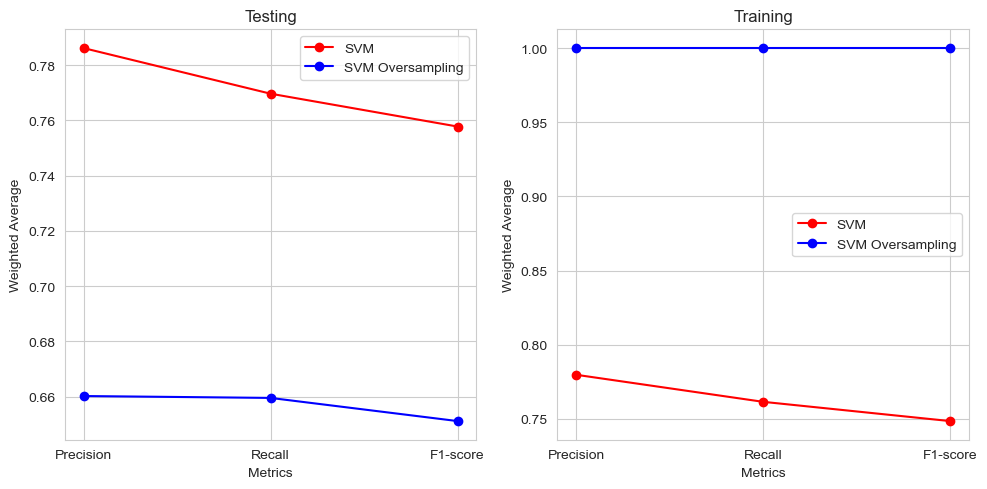

In [ ]:
weighted_avg_svm_test = classification_report(y_test, pred_svm_test, output_dict=True)['weighted avg'].values()
weighted_avg_svm_oversampling_test = classification_report(y_test, pred_svm_oversampling_test, output_dict=True)['weighted avg'].values()

weighted_avg_svm_train = classification_report(y_train, pred_svm_train, output_dict=True)['weighted avg'].values()
weighted_avg_svm_oversampling_train = classification_report(y_train_oversampling, pred_svm_oversampling_train, output_dict=True)['weighted avg'].values()
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot for testing
axs[0].plot(name_metrics, list(weighted_avg_svm_test)[:-1], marker='o', color='r', label='SVM')
axs[0].plot(name_metrics, list(weighted_avg_svm_oversampling_test)[:-1], marker='o', color='b', label='SVM Oversampling')
axs[0].set_xlabel('Metrics')
axs[0].set_ylabel('Weighted Average')
axs[0].set_title('Testing')
axs[0].legend()

# Plot for training
axs[1].plot(name_metrics, list(weighted_avg_svm_train)[:-1], marker='o', color='r', label='SVM')
axs[1].plot(name_metrics, list(weighted_avg_svm_oversampling_train)[:-1], marker='o', color='b', label='SVM Oversampling')
axs[1].set_xlabel('Metrics')
axs[1].set_ylabel('Weighted Average')
axs[1].set_title('Training')
axs[1].legend()

plt.tight_layout()

plt.show()

Similar to the chart above, based on the Weighted Average chart (vertical axis) with the precision, recall, and F1-score metrics (horizontal axis) for both the testing and training datasets, as well as the lines representing SVM and SVM Oversampling, we have the following observations:

SVM vs. SVM Oversampling:
- The SVM line represents the results of the SVM model on the testing and training datasets. When considering the precision, recall, and F1-score metrics, we can see that the SVM line has relatively high and stable scores on both datasets.
- The SVM Oversampling line represents the results of the SVM model with the Oversampling technique applied on the testing and training datasets. On the testing dataset, the SVM Oversampling line shows less variability and tends to be more stable compared to when weighted average is not used.

Overall, SVM Oversampling with weighted average tends to provide better results on the training dataset and shows more stability on the testing dataset. This suggests that using weighted average can help properly consider the contribution of each data class in the overall score calculation.

### 5.3.3 Accuracy

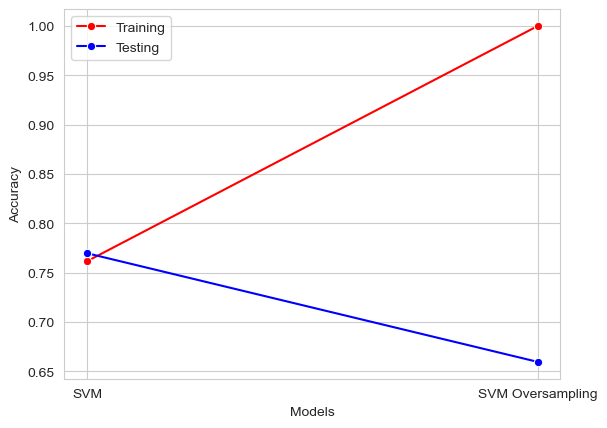

In [ ]:
accuracy_test = [accuracy_score(y_test, pred_svm_test), accuracy_score(y_test, pred_svm_oversampling_test)]
accuracy_train = [accuracy_score(y_train, pred_svm_train), accuracy_score(y_train_oversampling, pred_svm_oversampling_train)]

sns.lineplot(x=['SVM', 'SVM Oversampling'], y=accuracy_train, marker='o', color='r', label=f'Training')
sns.lineplot(x=['SVM', 'SVM Oversampling'], y=accuracy_test, marker='o', color='b', label=f'Testing')
plt.ylabel('Accuracy')
plt.xlabel('Models')
plt.show()

**Conclusion:** Based on the evaluation of macro average, weighted average, and accuracy metrics, we can infer that the SVM model without oversampling outperforms the SVM model with oversampling. This conclusion is drawn from its better performance in the testing phase.

In [ ]:
best_model = models['SVM']

### 5.3.4 Confusion matrix

In [ ]:
def plot_confusion_matrix(Y, pred):
    # Compute the confusion matrix
    cm = confusion_matrix(Y, pred)

    # Get the unique labels
    classes = np.unique(Y)

    # Plot the confusion matrix
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    ax.grid(False)  # turn off the grid
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=classes,
           yticklabels=classes,
           title='Confusion matrix',
           ylabel='True label',
           xlabel='Predicted label')

    # Loop over data dimensions and create text annotations
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], 'd'),
                    ha="center", va="center",
                    color="white" if cm[i,j] > cm.max() / 2. else "black")

    fig.tight_layout()
    plt.show()

In [ ]:
train_pred = best_model.predict(X_train).astype(int)
test_pred = best_model.predict(X_test).astype(int)

- Confusion matrix of traning set

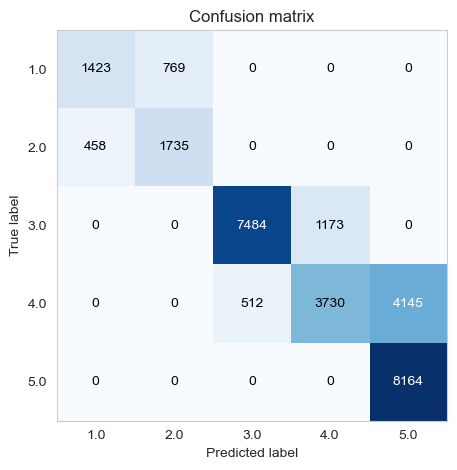

In [ ]:
plot_confusion_matrix(y_train, train_pred)

- Confusion matrix of testing set

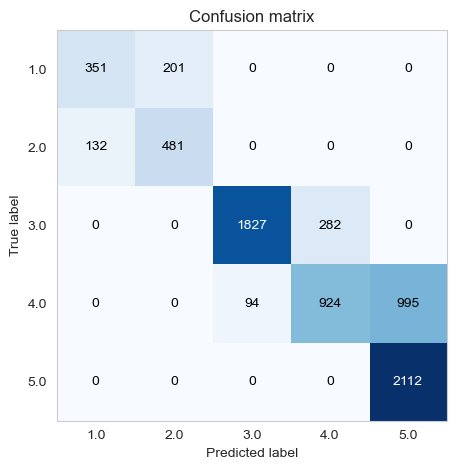

In [ ]:
plot_confusion_matrix(y_test, test_pred)

**Explanation**:

- Row 1 (Actual 1): The model predicted 351 instances as label 1, and it correctly classified all of them. There are 201 instances that were actually label 1 but were predicted as label 2. The remaining values in the row are all 0, indicating no misclassifications for other labels.

- Row 2 (Actual 2): The model predicted 132 instances as label 1 when they were actually label 2. It also predicted 481 instances as label 2, and all of them were correctly classified. The remaining values in the row are all 0.

- Row 3 (Actual 3): The model predicted 1827 instances as label 3, and all of them were correct predictions. There are 282 instances that were actually label 3 but were misclassified as label 4. The remaining values in the row are all 0.

- Row 4 (Actual 4): The model predicted 924 instances as label 4, and all of them were correctly classified. There are 94 instances that were actually label 4 but were misclassified as label 3. Additionally, there are 995 instances that were actually label 5 but were misclassified as label 4. The remaining values in the row are all 0.

- Row 5 (Actual 5): The model predicted 2112 instances as label 5, and all of them were correct predictions. The remaining values in the row are all 0.

**Interpretation**:
The confusion matrix provides a detailed breakdown of the model's predictions and their alignment with the actual labels. From the matrix, we can observe the following:

- The model performs well in predicting label 1, label 2, label 3, and label 5, as the diagonal elements in those rows are the highest in their respective rows.

- The model struggles the most with distinguishing between label 3 and label 4, as there are 282 instances of label 3 misclassified as label 4 and 94 instances of label 4 misclassified as label 3.

- The model also misclassifies a significant number of instances of label 4 as label 5, with 995 such misclassifications.

In the confusion matrix, we can see that our model has high accuracy in predicting label 1, label 2, and label 5, but it faces some challenges in distinguishing between label 3 and label 4.

With 282 instances of label 3 being predicted as label 4 and 94 instances of label 4 being predicted as label 3, **the recall of label 4 is low**. This means that our model sometimes confuses between label 3 and label 4. Additionally, the model tends to misclassify some instances of label 4 as label 5, with 995 such misclassifications.

However, by not predicting label 1 and label 2 as frequently, the model avoids misclassifying them as label 4 and label 5. This can be acceptable in this context, as our main goal is to identify customers with a high churn risk.

In summary, although the model has some challenges in distinguishing between label 3 and label 4, it can be accepted in this context since it doesn't predict label 1 and label 2 as frequently. Some misclassifications in high-risk churn labels can also be acceptable because those customers already have a high churn risk.


**Remark**: When we analyze the confusion matrix, we can see that churn risk scores of $3$, $4$, and $5$ are misclassified as only one point lower or higher than their actual class, which is acceptable level of error. Overall, the model seems to perform well because they do not misclassify into classes as low as $0$ or $1$.

### 5.3.5 Classification report

##### View with training set.

In [ ]:
print("Classification report: \n", classification_report(y_train, train_pred))

Classification report: 
               precision    recall  f1-score   support

         1.0       0.76      0.65      0.70      2192
         2.0       0.69      0.79      0.74      2193
         3.0       0.94      0.86      0.90      8657
         4.0       0.76      0.44      0.56      8387
         5.0       0.66      1.00      0.80      8164

    accuracy                           0.76     29593
   macro avg       0.76      0.75      0.74     29593
weighted avg       0.78      0.76      0.75     29593



##### View with testing set.

In [ ]:
print("Classification report: \n", classification_report(y_test, test_pred))

Classification report: 
               precision    recall  f1-score   support

         1.0       0.73      0.64      0.68       552
         2.0       0.71      0.78      0.74       613
         3.0       0.95      0.87      0.91      2109
         4.0       0.77      0.46      0.57      2013
         5.0       0.68      1.00      0.81      2112

    accuracy                           0.77      7399
   macro avg       0.77      0.75      0.74      7399
weighted avg       0.79      0.77      0.76      7399



# 6 - PCA

### 6.1 PCA - 3

In [43]:
rb = RobustScaler()
scaled_data = rb.fit_transform(X)

In [44]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(scaled_data)
pca_df_3 = pd.DataFrame(pca.transform(scaled_data), columns=["pca1", "pca2","pca3"])
pca_df_3.head()

,pca1,pca2,pca3
0,-1.282206,-0.621295,-0.776877
1,0.183706,-1.580249,-0.523523
2,1.062161,-0.012598,-0.279279
3,-1.788850,-0.591457,-0.263735
4,-1.141928,1.551606,-1.128559


In [45]:
svc_pca_3d = pd.concat([pca_df_3, pd.DataFrame({'churn_risk_score': y})], axis=1)
svc_pca_3d.head()

,pca1,pca2,pca3,churn_risk_score
0,-1.282206,-0.621295,-0.776877,5.0
1,0.183706,-1.580249,-0.523523,3.0
2,1.062161,-0.012598,-0.279279,3.0
3,-1.788850,-0.591457,-0.263735,5.0
4,-1.141928,1.551606,-1.128559,3.0


In [46]:
import plotly.express as px
import plotly.io as pio

fig = px.scatter_3d(
    data_frame= svc_pca_3d,
    x='pca1', y='pca2', z='pca3',
    color=svc_pca_3d.churn_risk_score.astype('category'),
    color_discrete_map={1: "#B41B10", 2: "#D79C4C", 3: "#8e18be", 4: "#34C5B3", 5: "#7D1F3F"},
    opacity=0.6, height=700,
    title='3D visualization by using PCA')


fig.update_traces(marker_size = 5)
pio.show(fig)

### 6.2 PCA - 2

In [47]:
pca = PCA(n_components=2)
pca.fit(scaled_data)
pca_df_2 = pd.DataFrame(pca.transform(scaled_data), columns=["pca1", "pca2"])
pca_df_2.head()

,pca1,pca2
0,-1.281738,-0.611476
1,0.183029,-1.579837
2,1.062480,-0.008045
3,-1.789417,-0.593692
4,-1.141740,1.562667


In [48]:
svc_pca_2d = pd.concat([pca_df_2, pd.DataFrame({'churn_risk_score': y})], axis=1)
svc_pca_2d.head()

,pca1,pca2,churn_risk_score
0,-1.281738,-0.611476,5.0
1,0.183029,-1.579837,3.0
2,1.062480,-0.008045,3.0
3,-1.789417,-0.593692,5.0
4,-1.141740,1.562667,3.0


In [49]:
fig = px.scatter(svc_pca_2d, x='pca1', y='pca2', color='churn_risk_score')
fig.update_layout(xaxis_title="pc1", yaxis_title="pc2", legend_title="churn_risk_score", title="2D visualization by using PCA")

pio.show(fig)

**Note:**

The scatter plot shows the visualization of data in two principal components (PCA1 and PCA2) and three principal components (PCA1, PCA2, and PCA3) using PCA (Principal Component Analysis).

In the 2D PCA plot, each data point is represented by a marker, and its position on the plot is determined by its PCA1 and PCA2 values. The color of the marker indicates the churn risk score, with different colors representing different scores. This plot helps us observe the distribution and clustering of data points based on their PCA values and how they relate to the churn risk score.

In the 3D PCA plot, each data point is represented by a marker in a three-dimensional space, with PCA1, PCA2, and PCA3 determining its position. The color of the marker still represents the churn risk score. This plot allows us to visualize the data from an additional dimension and gain insights into the patterns and relationships between variables.

These plots provide a visual representation of the data, allowing us to observe any discernible patterns, clusters, or separations based on the PCA values and their association with the churn risk score.






**The scatter plot visualization using PCA suggests that there is no linear relationship between the data points, as the clusters and patterns observed cannot be effectively separated by linear boundaries. However, it's worth noting that the analysis focused on the RBF kernel and excluded the linear and polynomial kernels. This observation is specifically related to the PCA analysis performed in this context.**

# 7 - Conclusion

The primary metric for evaluating the performance of the model in this problem is the `weighted average recall`. A high churn risk score indicates a higher likelihood of customer churn.The goal of the problem is to find out which customers are leaving in order to take measures to retain and retain the most customers, If we fail to identify all customers with high churn risk scores and instead predict that they have a low probability of churn, we are likely to experience a drop in revenue from those customers. 
 `Recall` in the classification problem of leaving customers is the ratio of correctly predicted leaving customers compared to the total number of actual leaving customers. So, we chose Recall score is our main metric for this problem , and we chose the weighted average as our main metric because we have a class imbalance in our dataset and want to evaluate the model's performance while considering this imbalance.